SELEÇÃO DO ARQUIVO DE DADOS

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving dadosWOPlant3.json to dadosWOPlant3.json


IMPORTANDO OS DADOS

In [ ]:
import pandas as pd
import json
file_name = "dadosWOPlant3.json"
uploaded[file_name].decode("utf-8")

'{\n  "readings" : [\n    {\n  "timesTamp": "2022-8-20 05:00:00",\n    "co2SGP": "564",\n    "humBME": "58.6",\n    "pressBME": "1016.01",\n    "sgpTVOC": "196",\n    "tempBME": "28.08",\n    "tempSHT31": "2819",\n    "tlsLUX": "0"\n  },{\n  "timesTamp": "2022-8-20 05:00:01",\n    "co2SGP": "564",\n    "humBME": "58.4",\n    "pressBME": "1016.00",\n    "sgpTVOC": "199",\n    "tempBME": "28.43",\n    "tempSHT31": "2819",\n    "tlsLUX": "0"\n  },{\n  "timesTamp": "2022-8-20 05:00:03",\n    "co2SGP": "557",\n    "humBME": "58.4",\n    "pressBME": "1016.00",\n    "sgpTVOC": "189",\n    "tempBME": "28.28",\n    "tempSHT31": "2816",\n    "tlsLUX": "0"\n  },{\n  "timesTamp": "2022-8-20 05:00:05",\n    "co2SGP": "568",\n    "humBME": "58.4",\n    "pressBME": "1015.99",\n    "sgpTVOC": "197",\n    "tempBME": "28.22",\n    "tempSHT31": "2818",\n    "tlsLUX": "0"\n  },{\n  "timesTamp": "2022-8-20 05:00:07",\n    "co2SGP": "576",\n    "humBME": "58.5",\n    "pressBME": "1016.00",\n    "sgpTVOC": "

TRANSFORMANDO OS DADOS EM DATAFRAME

In [ ]:
df = pd.read_json('dadosWOPlant3.json', orient='index')
df.head()

,0,1,2,3,4,5,6,7,8,9,...,64439,64440,64441,64442,64443,64444,64445,64446,64447,64448
readings,"{'timesTamp': '2022-8-20 05:00:00', 'co2SGP': ...","{'timesTamp': '2022-8-20 05:00:01', 'co2SGP': ...","{'timesTamp': '2022-8-20 05:00:03', 'co2SGP': ...","{'timesTamp': '2022-8-20 05:00:05', 'co2SGP': ...","{'timesTamp': '2022-8-20 05:00:07', 'co2SGP': ...","{'timesTamp': '2022-8-20 05:00:12', 'co2SGP': ...","{'timesTamp': '2022-8-20 05:00:15', 'co2SGP': ...","{'timesTamp': '2022-8-20 05:00:16', 'co2SGP': ...","{'timesTamp': '2022-8-20 05:00:18', 'co2SGP': ...","{'timesTamp': '2022-8-20 05:00:20', 'co2SGP': ...",...,"{'timesTamp': '2022-8-22 04:59:37', 'co2SGP': ...","{'timesTamp': '2022-8-22 04:59:39', 'co2SGP': ...","{'timesTamp': '2022-8-22 04:59:41', 'co2SGP': ...","{'timesTamp': '2022-8-22 04:59:43', 'co2SGP': ...","{'timesTamp': '2022-8-22 04:59:44', 'co2SGP': ...","{'timesTamp': '2022-8-22 04:59:50', 'co2SGP': ...","{'timesTamp': '2022-8-22 04:59:52', 'co2SGP': ...","{'timesTamp': '2022-8-22 04:59:54', 'co2SGP': ...","{'timesTamp': '2022-8-22 04:59:56', 'co2SGP': ...","{'timesTamp': '2022-8-22 04:59:57', 'co2SGP': ..."


In [ ]:
SUPERCOLUMN = 64449

TORNANDO O DATAFRAME EM ARRAY NUMPY

In [ ]:
import numpy as np
arr = df.to_numpy()
print('\nNumpy Array\n----------\n', arr[0][0])
print('\nNumpy Array Datatype :', arr.dtype)


Numpy Array
----------
 {'timesTamp': '2022-8-20 05:00:00', 'co2SGP': '564', 'humBME': '58.6', 'pressBME': '1016.01', 'sgpTVOC': '196', 'tempBME': '28.08', 'tempSHT31': '2819', 'tlsLUX': '0'}

Numpy Array Datatype : object


TRANSFORMANDO O JSON EM ARRAYS

In [ ]:
import json
from json import JSONEncoder
import numpy

class NumpyArrayEncoder(JSONEncoder):
    def default(self, obj):
        if isinstance(obj, numpy.ndarray):
            return obj.tolist()
        return JSONEncoder.default(self, obj)

numpyArrayOne = arr

# Serialization
numpyData = {"array": numpyArrayOne}
encodedNumpyData = json.dumps(numpyData, cls=NumpyArrayEncoder)  # use dump() to write array into file
print("Printing JSON serialized NumPy array")
print(encodedNumpyData)

# Deserialization
print("Decode JSON serialized NumPy array")
decodedArrays = json.loads(encodedNumpyData)

finalNumpyArray = numpy.asarray(decodedArrays["array"])
print("NumPy Array")
print(finalNumpyArray[0][5])



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
def functionToGetDataFromArray(element):
  listData = []
  j = 0
  for n in finalNumpyArray[0]:
    numpyData3 = {"array": finalNumpyArray[0][j]}
    listData.append(numpyData3['array'][element])
    j = j+1
  numpyData2 = {"array": finalNumpyArray[0][0]}
  encodedNumpyData = json.dumps(numpyData2, cls=NumpyArrayEncoder)  # use dump() to write array into file
  print("Decode JSON serialized NumPy array")
  decodedArrays = json.loads(encodedNumpyData)
  return listData

In [ ]:

timesTamp = functionToGetDataFromArray('timesTamp')
co2SGP = functionToGetDataFromArray('co2SGP')
humBME = functionToGetDataFromArray('humBME')
pressBME = functionToGetDataFromArray('pressBME')
sgpTVOC = functionToGetDataFromArray('sgpTVOC')
tempBME = functionToGetDataFromArray('tempBME')
tempSHT31 = functionToGetDataFromArray('tempSHT31')
tlsLUX = functionToGetDataFromArray('tlsLUX')
print(timesTamp)
print(co2SGP)
print(sgpTVOC)
print(humBME)
print(pressBME)
print(tempBME)
print(tempSHT31)
print(tlsLUX)

Decode JSON serialized NumPy array
Decode JSON serialized NumPy array
Decode JSON serialized NumPy array
Decode JSON serialized NumPy array
Decode JSON serialized NumPy array


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
print(timesTamp)
print(timesTamp[1][7], timesTamp[1][5])
number = ((int(timesTamp[0][10])*10 + int(timesTamp[0][11])) * 60) + (int(timesTamp[0][13])*10 + int(timesTamp[0][14]))
print(number)

['2022-8-20 05:00:00', '2022-8-20 05:00:01', '2022-8-20 05:00:03', '2022-8-20 05:00:05', '2022-8-20 05:00:07', '2022-8-20 05:00:12', '2022-8-20 05:00:15', '2022-8-20 05:00:16', '2022-8-20 05:00:18', '2022-8-20 05:00:20', '2022-8-20 05:00:26', '2022-8-20 05:00:27', '2022-8-20 05:00:29', '2022-8-20 05:00:31', '2022-8-20 05:00:33', '2022-8-20 05:00:39', '2022-8-20 05:00:40', '2022-8-20 05:00:42', '2022-8-20 05:00:44', '2022-8-20 05:00:46', '2022-8-20 05:00:51', '2022-8-20 05:00:53', '2022-8-20 05:00:55', '2022-8-20 05:00:57', '2022-8-20 05:00:59', '2022-8-20 05:01:05', '2022-8-20 05:01:06', '2022-8-20 05:01:08', '2022-8-20 05:01:10', '2022-8-20 05:01:12', '2022-8-20 05:01:16', '2022-8-20 05:01:19', '2022-8-20 05:01:21', '2022-8-20 05:01:23', '2022-8-20 05:01:25', '2022-8-20 05:01:30', '2022-8-20 05:01:32', '2022-8-20 05:01:34', '2022-8-20 05:01:37', '2022-8-20 05:01:39', '2022-8-20 05:01:44', '2022-8-20 05:01:46', '2022-8-20 05:01:48', '2022-8-20 05:01:50', '2022-8-20 05:01:52', '2022-8-2

In [ ]:
print(timesTamp)
# print(timesTamp[1][9], timesTamp[1][10])
# number = ((int(timesTamp[0][9])*10 + int(timesTamp[0][10])) * 60) + (int(timesTamp[0][12])*10 + int(timesTamp[0][13]))
# print(number)
lines = 0
columns = 0
cincoHoras = 5
dezesseteHoras = 17
while columns < SUPERCOLUMN:
  #number = ((int(timesTamp[columns][9])*10 + int(timesTamp[columns][10])) * 60) + (int(timesTamp[columns][12])*10 + int(timesTamp[columns][13]))
  number = (int(timesTamp[columns][10])*10 + int(timesTamp[columns][11]))
  # if(int(timesTamp[columns][7]) == 7):
    # if(number > dezesseteHoras):
    #   print("stop line: ", columns)
  
  #print(timesTamp[columns])
  if(number >= cincoHoras):
    if(number <= dezesseteHoras):
      timesTamp[columns] = 'DIA'
    else:
      timesTamp[columns] = 'NOITE'
  else:
    timesTamp[columns] = 'NOITE'
  
  columns = columns + 1
  if(lines >= SUPERCOLUMN):
    break;


['2022-8-20 05:00:00', '2022-8-20 05:00:01', '2022-8-20 05:00:03', '2022-8-20 05:00:05', '2022-8-20 05:00:07', '2022-8-20 05:00:12', '2022-8-20 05:00:15', '2022-8-20 05:00:16', '2022-8-20 05:00:18', '2022-8-20 05:00:20', '2022-8-20 05:00:26', '2022-8-20 05:00:27', '2022-8-20 05:00:29', '2022-8-20 05:00:31', '2022-8-20 05:00:33', '2022-8-20 05:00:39', '2022-8-20 05:00:40', '2022-8-20 05:00:42', '2022-8-20 05:00:44', '2022-8-20 05:00:46', '2022-8-20 05:00:51', '2022-8-20 05:00:53', '2022-8-20 05:00:55', '2022-8-20 05:00:57', '2022-8-20 05:00:59', '2022-8-20 05:01:05', '2022-8-20 05:01:06', '2022-8-20 05:01:08', '2022-8-20 05:01:10', '2022-8-20 05:01:12', '2022-8-20 05:01:16', '2022-8-20 05:01:19', '2022-8-20 05:01:21', '2022-8-20 05:01:23', '2022-8-20 05:01:25', '2022-8-20 05:01:30', '2022-8-20 05:01:32', '2022-8-20 05:01:34', '2022-8-20 05:01:37', '2022-8-20 05:01:39', '2022-8-20 05:01:44', '2022-8-20 05:01:46', '2022-8-20 05:01:48', '2022-8-20 05:01:50', '2022-8-20 05:01:52', '2022-8-2

In [ ]:


# lines = 0
# columns = 0
# cincoHoras = 5 * 60
# dezesseteHoras = 17 * 60
# while columns < SUPERCOLUMN:

#   if(timesTamp[columns] != 'DIA'):
#     if(timesTamp[columns] != 'NOITE'):
#       number = ((int(timesTamp[columns][9])*10 + int(timesTamp[columns][10])) * 60) 
#       if(number > 5):
#         if(number <17):
#           timesTamp[columns] = 'DIA'
#         elif(number == 17):
#           number = (int(timesTamp[columns][12])*10 + int(timesTamp[columns][13]))
#           if(number == 0):
#             timesTamp[columns] = 'DIA'
#           else:
#             timesTamp[columns] = 'NOITE'
#         else:
#           timesTamp[columns] = 'NOITE'
#       elif(number < 5):
#         timesTamp[columns] = 'NOITE'
#       else:
#         number = (int(timesTamp[columns][12])*10 + int(timesTamp[columns][13]))
#         if(number >= 0):
#           timesTamp[columns] = 'DIA'
#   columns = columns + 1
# print(timesTamp)

In [ ]:
print(timesTamp)

['DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA'

In [ ]:
# https://www.adamsmith.haus/python/answers/how-to-add-a-column-to-a-pandas-dataframe-from-a-list-in-python#:~:text=Use%20DataFrame%20indexing%20to%20add,element%20in%20list%20to%20pd.
# print do dataframe original
from numpy import random
data_array = random.randint(100, size=(SUPERCOLUMN, 4))
lines = 0
columns = 0
while(lines < SUPERCOLUMN):
    # data_array[lines][0] = timesTamp[lines]
    data_array[lines][0] = co2SGP[lines]
    data_array[lines][1] = sgpTVOC[lines]
    # data_array[lines][2] = int(float(pressBME[lines]))tlsLUX
    # data_array[lines][3] = int(float(tempBME[lines]))
    data_array[lines][2] = tlsLUX[lines]
    # data_array[lines][5] = int(float(humBME[lines]))
    data_array[lines][3] = tempSHT31[lines]
    lines = lines + 1
column_names = ["co2", "tvoc", "lux","temperatureSHT31"]
data_df = pd.DataFrame(data_array, columns=column_names)
data_df["temperatureBME"] = tempBME
data_df["humidity"] = humBME
data_df["pressure"] = pressBME
data_df["timesTamp"] = timesTamp
data_df.head(SUPERCOLUMN)

,co2,tvoc,lux,temperatureSHT31,temperatureBME,humidity,pressure,timesTamp
0,564,196,0,2819,28.08,58.6,1016.01,DIA
1,564,199,0,2819,28.43,58.4,1016.00,DIA
2,557,189,0,2816,28.28,58.4,1016.00,DIA
3,568,197,0,2818,28.22,58.4,1015.99,DIA
4,576,201,0,2816,28.18,58.5,1016.00,DIA
...,...,...,...,...,...,...,...,...
64444,605,141,0,2838,28.11,70.8,1015.56,NOITE
64445,599,133,0,2838,28.35,70.6,1015.56,NOITE
64446,605,136,0,2833,28.24,70.7,1015.56,NOITE
64447,611,135,0,2835,28.20,70.7,1015.57,NOITE


In [ ]:
# https://www.adamsmith.haus/python/answers/how-to-add-a-column-to-a-pandas-dataframe-from-a-list-in-python#:~:text=Use%20DataFrame%20indexing%20to%20add,element%20in%20list%20to%20pd.
from numpy import random
data_array = random.randint(100, size=(SUPERCOLUMN, 7))
lines = 0
columns = 0
while(lines < SUPERCOLUMN):
    # data_array[lines][0] = timesTamp[lines]
    data_array[lines][0] = co2SGP[lines]
    data_array[lines][1] = sgpTVOC[lines]
    data_array[lines][2] = int(float(pressBME[lines]))
    data_array[lines][3] = int(float(tempBME[lines]))
    data_array[lines][4] = tlsLUX[lines]
    data_array[lines][5] = int(float(humBME[lines]))
    data_array[lines][6] = tempSHT31[lines]
    lines = lines + 1
column_names = ["co2", "tvoc","pressure","temperatureBME", "lux","humidity", "temperatureSHT31"]
data_df = pd.DataFrame(data_array, columns=column_names)
# data_df["temperatureBME"] = tempBME
#data_df["humidity"] = humBME
# data_df["pressure"] = pressBME
data_df["timesTamp"] = timesTamp
# lista = []
# lines = 0
# while(lines < SUPERCOLUMN):
#   lista.append(lines)
#   lines = lines + 1
# print(lista)
data_df.head(SUPERCOLUMN)

,co2,tvoc,pressure,temperatureBME,lux,humidity,temperatureSHT31,timesTamp
0,564,196,1016,28,0,58,2819,DIA
1,564,199,1016,28,0,58,2819,DIA
2,557,189,1016,28,0,58,2816,DIA
3,568,197,1015,28,0,58,2818,DIA
4,576,201,1016,28,0,58,2816,DIA
...,...,...,...,...,...,...,...,...
64444,605,141,1015,28,0,70,2838,NOITE
64445,599,133,1015,28,0,70,2838,NOITE
64446,605,136,1015,28,0,70,2833,NOITE
64447,611,135,1015,28,0,70,2835,NOITE


In [ ]:
lista = []
lines = 0
while(lines < SUPERCOLUMN ):
  lista.append(lines)
  lines = lines + 1
data_df["index"] = lista
data_df.set_index('index')


,co2,tvoc,pressure,temperatureBME,lux,humidity,temperatureSHT31,timesTamp
index,,,,,,,,
0,564,196,1016,28,0,58,2819,DIA
1,564,199,1016,28,0,58,2819,DIA
2,557,189,1016,28,0,58,2816,DIA
3,568,197,1015,28,0,58,2818,DIA
4,576,201,1016,28,0,58,2816,DIA
...,...,...,...,...,...,...,...,...
64444,605,141,1015,28,0,70,2838,NOITE
64445,599,133,1015,28,0,70,2838,NOITE
64446,605,136,1015,28,0,70,2833,NOITE


CALCULO DA CORRELAÇÃO ENTRE OS PARÂMETROS:
https://medium.com/omixdata/estat%C3%ADstica-an%C3%A1lise-de-correla%C3%A7%C3%A3o-usando-python-e-r-d68611511b5a#:~:text=O%20coeficiente%20de%20Pearson%2C%20tamb%C3%A9m,valores%20entre%20%2D1%20e%201.

https://www.delftstack.com/pt/howto/python-pandas/pandas-correlation-matrix/

https://www.questionpro.com/blog/pt-br/correlacao-de-pearson/

https://queirozf.com/entries/pandas-dataframe-plot-examples-with-matplotlib-pyplot#scatter-plot-of-two-columns

Valor = -1 -> Correlação linear perfeita negativa
Valor = 1 -> Correlação linear perfeita positiva
Valor = 0 -> Auxência de relacionamento linear. Os parâmetros não mostram "alinhamento". Correlação **NULA**
-1 < Valor < 0 -> Correlação negativa (x sobe; y desce)
0 < Valor < 1 -> Correlação positiva (x sobe; y sobe)

Teoria sobre os testes de correlação:
http://www.mat.ufrgs.br/~viali/pg/material/laminaspime/CRS_6.pdf


In [ ]:
#CALCULO DA MÉDIA E DA MEDIANA
print(data_df.describe())

                co2          tvoc      pressure  temperatureBME           lux  \
count  64449.000000  64449.000000  64449.000000    64449.000000  64449.000000   
mean     509.982560    180.059117   1015.505780       29.120266   3864.554547   
std       91.178697     87.170609      1.023056        1.221134   7162.541847   
min      400.000000      0.000000   1013.000000       26.000000      0.000000   
25%      430.000000    122.000000   1015.000000       28.000000      0.000000   
50%      489.000000    176.000000   1015.000000       29.000000    100.000000   
75%      588.000000    231.000000   1016.000000       30.000000   5200.000000   
max     1297.000000    941.000000   1017.000000       32.000000  65400.000000   

           humidity  temperatureSHT31         index  
count  64449.000000      64449.000000  64449.000000  
mean      62.361821       2948.859672  32224.000000  
std        5.181251        123.539493  18604.968087  
min       51.000000       2595.000000      0.000000  


Valores do coeficiente de correlação de Pearson: 
                       co2      tvoc  pressure  temperatureBME       lux  \
co2               1.000000  0.655943  0.237154       -0.210533 -0.046000   
tvoc              0.655943  1.000000  0.155063        0.233991  0.103848   
pressure          0.237154  0.155063  1.000000       -0.232137 -0.186990   
temperatureBME   -0.210533  0.233991 -0.232137        1.000000  0.419680   
lux              -0.046000  0.103848 -0.186990        0.419680  1.000000   
humidity          0.122773 -0.480900  0.266280       -0.702535 -0.368795   
temperatureSHT31 -0.210146  0.234153 -0.210050        0.943137  0.440414   
index            -0.116764 -0.528585  0.045471       -0.086693 -0.223923   

                  humidity  temperatureSHT31     index  
co2               0.122773         -0.210146 -0.116764  
tvoc             -0.480900          0.234153 -0.528585  
pressure          0.266280         -0.210050  0.045471  
temperatureBME   -0.702535          0

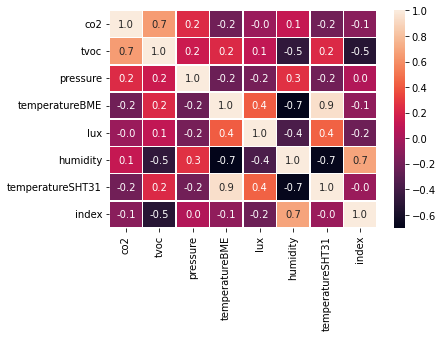

In [ ]:
# Calculo da correlação entre os parâmetros
import seaborn as sn
correlation = data_df.corr(method='pearson')
print("Valores do coeficiente de correlação de Pearson: ")
print(correlation, "\n")
print("Pode-se perceber que a relação linear mais forte é entre co2 e tvoc.")
plot = sn.heatmap(correlation, annot = True, fmt=".1f", linewidths=.6)
plot

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

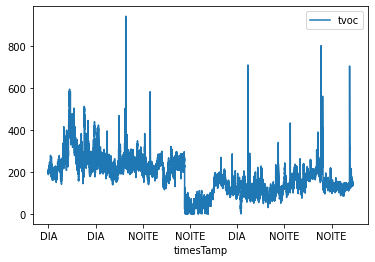

In [ ]:
import matplotlib.pyplot as plt # Impot the relevant module
# fig, ax = plt.subplots() # Create the figure and axes object
# data_df.plot(x = 'timesTamp', y = 'tvoc', ax = ax) 
# data_df.plot(x = 'timesTamp', y = 'pressure', ax = ax, secondary_y = True) 

data_df.plot(x ='timesTamp', y='tvoc', kind = 'line')
# data_df.plot(x ='timesTamp', y='pressure', color = 'red', kind = 'line')
# plt.show()
plt.savefig("rawwop.eps")
files.download("rawwop.eps")

CICLO DIA NOITE

In [ ]:
# lines = 0
# soma= 0
# idxNoite = 0
# qtdSomada = 0
# # while(lines < SUPERCOLUMN):
# #   if(timesTamp[lines] == 'NOITE'):
# #     break;
# #   lines += 1
# # print("lines1: ",lines)



# #lines = 0
# soma= 0
# soma2 = 0
# idxNoite = 0
# qtdSomada = 0
# while(lines < SUPERCOLUMN):
#   if(timesTamp[lines] == 'DIA'):
#     soma = soma + int(sgpTVOC[lines])
#     soma2 = soma2 + int(humBME[lines])
#     qtdSomada = qtdSomada + 1
#   elif(timesTamp[lines] == 'NOITE'):
#     idxNoite = lines
#     break
#   lines += 1
  
# print(soma)
# mediaDia1 = soma/qtdSomada
# media2Dia1 = soma2/qtdSomada
# print(mediaDia1)
# print(idxNoite)

# lines = idxNoite
# soma= 0
# soma2 = 0
# idxNoite = 0
# idxDia2 = 0
# qtdSomada = 0
# while(lines < SUPERCOLUMN):
#   if(timesTamp[lines] == 'DIA'):
#     soma = soma + int(sgpTVOC[lines])
#     soma2 = soma2 + int(humBME[lines])
#     qtdSomada = qtdSomada + 1
#   elif(timesTamp[lines] == 'NOITE'):
#       idxDia2 = lines
#       break
#   lines += 1
  
# print(soma)
# mediaDia2 = soma/qtdSomada
# media2Dia2 = soma2/qtdSomada
# print(mediaDia2)

# lines = idxDia2
# soma= 0
# soma2 = 0
# idxNoite = 0
# idxDia2 = 0
# qtdSomada = 0
# while(lines < SUPERCOLUMN):
#   if(timesTamp[lines] == 'DIA'):
#     soma = soma + int(sgpTVOC[lines])
#     soma2 = soma2 + int(humBME[lines])
#     qtdSomada = qtdSomada + 1
#   elif(timesTamp[lines] == 'NOITE'):
#       idxNoite = lines
#       break
#   lines += 1
  
# print(soma)
# mediaDia3 = soma/qtdSomada
# media2Dia3 = soma2/qtdSomada
# print(mediaDia3)

# lines = idxNoite
# soma= 0
# soma2 = 0
# idxNoite = 0
# idxDia2 = 0
# qtdSomada = 0
# while(lines < SUPERCOLUMN):
#   if(timesTamp[lines] == 'DIA'):
#     soma = soma + int(sgpTVOC[lines])
#     soma2 = soma2 + int(humBME[lines])
#     qtdSomada = qtdSomada + 1
#   elif(timesTamp[lines] == 'NOITE'):
#       idxDia2 = lines
#       break
#   lines += 1
  
# print(soma)
# mediaDia4 = soma/qtdSomada
# media2Dia4 = soma2/qtdSomada
# print(mediaDia4)

In [ ]:
lines = 0
soma= 0
soma2 = 0
idxNoite = 0
qtdSomada = 0
# while(lines < 84635):
#   if(timesTamp[lines] == 'NOITE'):
#     break;
#   lines += 1
# print("lines1: ",lines)



#lines = 0
soma= 0
soma2 = 0
soma3 = 0
soma4 = 0
soma5 = 0
idxNoite = 0
qtdSomada = 0
while(lines < SUPERCOLUMN):
  if(timesTamp[lines] == 'DIA'):
    soma = soma + int(sgpTVOC[lines])
    soma2 = soma2 + float(humBME[lines])
    soma3 = soma3 + float(tempBME[lines])
    soma4 = soma4 + float(pressBME[lines])
    soma5 = soma5 + float(tlsLUX[lines])
    qtdSomada = qtdSomada + 1
  elif(timesTamp[lines] == 'NOITE'):
    idxNoite = lines
    break
  lines += 1
  
print(soma)
mediaDia1 = soma/qtdSomada
media2Dia1 = soma2/qtdSomada
media3Dia1 = soma3/qtdSomada
media4Dia1 = soma4/qtdSomada
media5Dia1 = soma5/qtdSomada
print(mediaDia1)
print(idxNoite)

lines = idxNoite
soma= 0
soma2= 0
soma3 = 0
soma4 = 0
soma5 = 0
idxNoite = 0
idxDia2 = 0
qtdSomada = 0
while(lines < SUPERCOLUMN):
  if(timesTamp[lines] == 'NOITE'):
    soma = soma + int(sgpTVOC[lines])
    soma2 = soma2 + float(humBME[lines])
    soma3 = soma3 + float(tempBME[lines])
    soma4 = soma4 + float(pressBME[lines])
    soma5 = soma5 + float(tlsLUX[lines])
    qtdSomada = qtdSomada + 1
  elif(timesTamp[lines] == 'DIA'):
      idxDia2 = lines
      break
  lines += 1
  
print(soma)
mediaDia2 = soma/qtdSomada
media2Dia2 = soma2/qtdSomada
media3Dia2 = soma3/qtdSomada
media4Dia2 = soma4/qtdSomada
media5Dia2 = soma5/qtdSomada
print(mediaDia2)

lines = idxDia2
soma= 0
soma2=0
soma3 = 0
soma4 = 0
soma5 = 0
idxNoite = 0
idxDia2 = 0
qtdSomada = 0
while(lines < SUPERCOLUMN):
  if(timesTamp[lines] == 'DIA'):
    soma = soma + int(sgpTVOC[lines])
    soma2 = soma2 + float(humBME[lines])
    soma3 = soma3 + float(tempBME[lines])
    soma4 = soma4 + float(pressBME[lines])
    soma5 = soma5 + float(tlsLUX[lines])
    qtdSomada = qtdSomada + 1
  elif(timesTamp[lines] == 'NOITE'):
      idxNoite = lines
      break
  lines += 1
  
print(soma)
mediaDia3 = soma/qtdSomada
media2Dia3 = soma2/qtdSomada
media3Dia3 = soma3/qtdSomada
media4Dia3 = soma4/qtdSomada
media5Dia3 = soma5/qtdSomada
print(mediaDia3)

lines = idxNoite
soma= 0
soma2 = 0
soma3 = 0
soma4 = 0
soma5 = 0
idxNoite = 0
idxDia2 = 0
qtdSomada = 0
while(lines < SUPERCOLUMN):#84635):
  if(timesTamp[lines] == 'NOITE'):
    soma = soma + int(sgpTVOC[lines])
    soma2 = soma2 + float(humBME[lines])
    soma3 = soma3 + float(tempBME[lines])
    soma4 = soma4 + float(pressBME[lines])
    soma5 = soma5 + float(tlsLUX[lines])
    qtdSomada = qtdSomada + 1
  elif(timesTamp[lines] == 'DIA'):
      idxDia2 = lines
      break
  lines += 1
  
print(soma)
mediaDia4 = soma/qtdSomada
media2Dia4 = soma2/qtdSomada
media3Dia4 = soma3/qtdSomada
media4Dia4 = soma4/qtdSomada
media5Dia4 = soma5/qtdSomada
print(mediaDia4)

4651456
261.02446689113356
17820
2636525
175.05643715556735
1946187
116.0171087928465
2370462
160.24214155343745


In [ ]:

# mediaDia1 = mediaDia1/mediaDia2#DIA
# mediaDia2 = mediaDia2/mediaDia2#DIA
# mediaDia3 = mediaDia3/mediaDia2#NOITE
# mediaDia4 = mediaDia4/mediaDia2#DIA

# media2Dia1 = media2Dia1/media2Dia2
# media2Dia2 = media2Dia2/media2Dia2
# media2Dia3 = media2Dia3/media2Dia2
# media2Dia4 = media2Dia4/media2Dia2

# media3Dia1 = media3Dia1/media3Dia2
# media3Dia2 = media3Dia2/media3Dia2
# media3Dia3 = media3Dia3/media3Dia2
# media3Dia4 = media3Dia4/media3Dia2

# media4Dia1 = media4Dia1/media4Dia2
# media4Dia2 = media4Dia2/media4Dia2
# media4Dia3 = media4Dia3/media4Dia2
# media4Dia4 = media4Dia4/media4Dia2

# media5Dia1 = media5Dia1/media5Dia2
# media5Dia2 = media5Dia2/media5Dia2
# media5Dia3 = media5Dia3/media5Dia2
# media5Dia4 = media5Dia4/media5Dia2

In [ ]:
data_array = np. empty((4, 5), float)
print("mediaDia1: ",mediaDia1)
print("mediaDia2: ",mediaDia2)
print("mediaDia3: ",mediaDia3)
print("mediaDia4: ",mediaDia4)

# empty_array[0][0] = mediaDia4/mediaDia2
# print("data_array[3][0]: ",mediaDia4/mediaDia2)

mediaDia1:  261.02446689113356
mediaDia2:  175.05643715556735
mediaDia3:  116.0171087928465
mediaDia4:  160.24214155343745


In [ ]:
#PEGANDO OS DADOS ORIUNDOS DO ARQUIVO "COM PLANTA E COM SOL" PARA LER O TVOC
dividendoTVOC = 995.3932545796953


NORMALIZANDO: FORMA 1

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

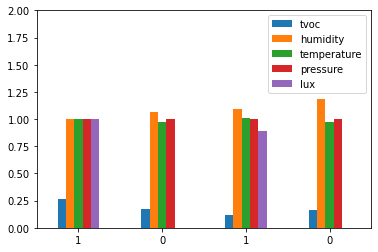

In [ ]:
data_array[0][0] = mediaDia1/dividendoTVOC#vocs
data_array[1][0] = mediaDia2/dividendoTVOC
data_array[2][0] = mediaDia3/dividendoTVOC
data_array[3][0] = mediaDia4/dividendoTVOC

data_array[0][1] = media2Dia1/media2Dia1
data_array[1][1] = media2Dia2/media2Dia1
data_array[2][1] = media2Dia3/media2Dia1
data_array[3][1] = media2Dia4/media2Dia1

data_array[0][2] = media3Dia1/media3Dia1
data_array[1][2] = media3Dia2/media3Dia1
data_array[2][2] = media3Dia3/media3Dia1
data_array[3][2] = media3Dia4/media3Dia1

data_array[0][3] = media4Dia1/media4Dia1
data_array[1][3] = media4Dia2/media4Dia1
data_array[2][3] = media4Dia3/media4Dia1
data_array[3][3] = media4Dia4/media4Dia1

data_array[0][4] = media5Dia1/media5Dia1
data_array[1][4] = media5Dia2/media5Dia1
data_array[2][4] = media5Dia3/media5Dia1
data_array[3][4] = media5Dia4/media5Dia1
column_names = ["tvoc","humidity","temperature", "pressure", "lux"]
data_df = pd.DataFrame(data_array, columns=column_names)
lista = [1, 0,1,0]
data_df[""] = lista
data_df.head(4)
# data_df.plot.bar(x ='timesTamp', y='tvoc', rot = 0)
# data_df.plot.bar(x ='timesTamp', y='hum', rot = 0)
# data_df.plot.bar(x ='timesTamp', y='temp', rot = 0)
ax = data_df.plot.bar(x = '', rot=0)
plt.ylim((0,2))
plt.legend(loc='upper right')
#Baixar o gráfico em formato ".eps"
plt.savefig("figWOPlant.eps")
files.download("figWOPlant.eps")

NORMALIZANDO: FORMA 2

,tvoc,humidity,temperature,pressure,lux,
0,1.000000,0.845607,0.994288,0.999388,1.000000,1.0
1,0.670651,0.904125,0.967856,0.999733,0.000058,0.0
2,0.444468,0.922458,1.000000,0.999637,0.889458,1.0
3,0.613897,1.000000,0.968863,1.000000,0.000591,0.0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

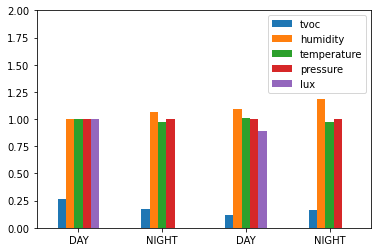

In [ ]:
df_max_scaled = data_df.copy() 
for column in df_max_scaled.columns: 
    df_max_scaled[column] = df_max_scaled[column]  / df_max_scaled[column].abs().max() 
      
display(df_max_scaled)
lista = ["DAY", "NIGHT","DAY","NIGHT"]
data_df[""] = lista
ax = data_df.plot.bar(x = '', rot=0)
plt.ylim((0,2))
plt.legend(loc='upper right')
#Baixar o gráfico em formato ".eps"
plt.savefig("figWOPlant.eps")
files.download("figWOPlant.eps")